# Mapa de vulnerabilidad

In [ ]:
!pip install googlemaps
!pip install swifter
!pip install contextily
!pip install haversine
!pip install mapclassify
import geocoder, geopy
from geopy.geocoders import Nominatim
import pandas as pd
import numpy as np
import googlemaps
import math
import geopandas as gpd
from geopandas.tools import geocode
import re
import multiprocessing as mp
from tqdm import tqdm   #packages to mesuare time's loop
import swifter
from shapely.geometry import Point, LineString, Polygon, MultiPoint
import os
import re

import contextily as cx  # import street map
from pyproj import CRS
import matplotlib.patches as mpatches
import haversine as hs
from tqdm import tqdm
import swifter # parallel procesing
from matplotlib.lines import Line2D
from matplotlib.offsetbox import (OffsetImage, AnnotationBbox)
import matplotlib.image as image

import matplotlib.pyplot as plt
import os
import seaborn as sns

from matplotlib.patches import Circle


import locale
from matplotlib.dates import DateFormatter
from datetime import datetime
from matplotlib.patches import Ellipse

# Configurar el entorno local a español
#locale.setlocale(locale.LC_TIME, 'es_ES.utf8')
#import matplotlib
# Configurar Matplotlib para usar Arial como tipo de letra predeterminado
#matplotlib.rcParams['font.family'] = 'Arial'
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'

import matplotlib.dates as mdates
mdates.DateFormatter("%d %B %Y")

import warnings
warnings.filterwarnings('ignore')

import unicodedata

import plotly.graph_objects as go # te permite generar imagenes de un objeto

In [ ]:
# Nos conectamos al Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
# Cambiar el directorio de trabajo
os.chdir('/content/drive/My Drive/BCRP/input')

# Mostrar el directorio actual de trabajo
print("Directorio actual:", os.getcwd())

# Listar todos los archivos y carpetas en el directorio actual
print("\nArchivos y carpetas en el directorio actual:")
print(os.listdir())

!ls "/content/drive/My Drive/BCRP/input"

Directorio actual: /content/drive/My Drive/BCRP/input

Archivos y carpetas en el directorio actual:
['Usoactual_AMAZONAS.dbf', 'Usoactual_AMAZONAS.shx', 'Usoactual_LAMBAYEQUE.dbf', 'Usoactual_LAMBAYEQUE.sbx', 'Usoactual_LAMBAYEQUE.shp', 'Usoactual_LAMBAYEQUE.prj', 'Usoactual_LAMBAYEQUE.sbn', 'Usoactual_LAMBAYEQUE.shx', 'Usoactual_LAMBAYEQUE.shp.xml', 'Usoactual_PIURA.prj', 'Usoactual_PIURA.shp', 'Usoactual_PIURA.sbx', 'Usoactual_PIURA.sbn', 'Usoactual_PIURA.shx', 'Usoactual_PIURA.dbf', 'Usoactual_PIURA.shp.xml', 'Lima_Hectareas_Senasa.xlsx', 'INEI_LIMITE_DEPARTAMENTAL.shp', 'INEI_LIMITE_DISTRITAL.shp', 'INEI_LIMITE_DEPARTAMENTAL.cpg', 'INEI_LIMITE_DEPARTAMENTAL.shp.xml', 'INEI_LIMITE_DEPARTAMENTAL.dbf', 'INEI_LIMITE_DEPARTAMENTAL.prj', 'INEI_LIMITE_DEPARTAMENTAL.sbn', 'INEI_LIMITE_DEPARTAMENTAL.sbx', 'INEI_LIMITE_DISTRITAL.cpg', 'INEI_LIMITE_DISTRITAL.dbf', 'INEI_LIMITE_DISTRITAL.prj', 'INEI_LIMITE_DISTRITAL.sbn', 'INEI_LIMITE_DISTRITAL.sbx', 'INEI_LIMITE_DISTRITAL.shx', 'INEI_LIMITE_P

## Mapas

In [ ]:
print(map_dist.columns)

map_dist_sullana['CCDD'].unique()

Index(['CCDD', 'NOMBDEP', 'CCPP', 'NOMBPROV', 'CCDI', 'NOMBDIST', 'CAPITAL',
       'UBIGEO', 'IDPROV', 'CODIGO', 'CNT_CCPP', 'DESCRIPCIO', 'DESCARGAR',
       'WHATSAPP', 'CONTACTO', 'geometry'],
      dtype='object')


array(['20'], dtype=object)

In [ ]:
distrito = "/content/drive/My Drive/BCRP/input/INEI_LIMITE_DISTRITAL.shp"
provincia = "/content/drive/My Drive/BCRP/input/INEI_LIMITE_PROVINCIAL.shp"
departamento = "/content/drive/My Drive/BCRP/input/INEI_LIMITE_DEPARTAMENTAL.shp"
sullana = "/content/drive/My Drive/BCRP/input/Sullana_Geodinámica.shp"
sullana_poblacion = "/content/drive/My Drive/BCRP/input/Sullana_poblacion.shp"
inundable = "/content/drive/My Drive/BCRP/input/areas_inundables.shp"
usoactual_PIURA = "/content/drive/My Drive/BCRP/input/Usoactual_PIURA.shp"
usoactual_LAMBAYEQUE = "/content/drive/My Drive/BCRP/input/Usoactual_LAMBAYEQUE.shp"
usoactual_TUMBES = "/content/drive/My Drive/BCRP/input/Usoactual_TUMBES.shp"
usoactual_AMAZONAS = "/content/drive/My Drive/BCRP/input/Usoactual_AMAZONAS.shp"



map_dist = gpd.read_file(distrito)
map_dep = gpd.read_file(departamento)
map_prov = gpd.read_file(provincia)
map_sullana = gpd.read_file(sullana)
sullana_poblacion = gpd.read_file(sullana_poblacion)
map_inundacion = gpd.read_file(inundable)
map_usoactual_PIURA = gpd.read_file(usoactual_PIURA)
map_usoactual_LAMBAYEQUE = gpd.read_file(usoactual_LAMBAYEQUE)
map_usoactual_TUMBES = gpd.read_file(usoactual_TUMBES)
map_usoactual_AMAZONAS = gpd.read_file(usoactual_AMAZONAS)


map_dep_piura = map_dep[map_dep['NOMBDEP'] == 'PIURA']
map_dep_lambayeque = map_dep[map_dep['NOMBDEP'] == 'LAMBAYEQUE']
map_dep_tumbes = map_dep[map_dep['NOMBDEP'] == 'TUMBES']
map_dep_amazonas = map_dep[map_dep['NOMBDEP'] == 'AMAZONAS']
map_prov_sullana = map_prov[map_prov['NOMBPROV'] == 'SULLANA']
map_dist_sullana = map_dist[map_dist['NOMBDIST'] == 'SULLANA']
sullana_poblacion_200601 = sullana_poblacion[sullana_poblacion['UBIGEO'] == '200601']
map_dep_norte = pd.concat([map_dep_piura, map_dep_lambayeque, map_dep_tumbes, map_dep_amazonas])
#map_dep_norte= map_dep[map_dep['ZONA'] == 'NORTE']



In [ ]:
# Lista de mapas
mapas = {
    'Distritos': map_dist,
    'Departamentos': map_dep,
    'Provincias': map_prov,
    'Inundación': map_inundacion,
    'Uso Actual Piura': map_usoactual_PIURA,
    'Uso Actual Lambayeque': map_usoactual_LAMBAYEQUE,
    'Uso Actual Tumbes': map_usoactual_TUMBES,
    'Uso Actual Amazonas': map_usoactual_AMAZONAS,
    'Piura': map_dep_piura,
    'Lambayeque': map_dep_lambayeque,
    'Tumbes': map_dep_tumbes,
    'Amazonas': map_dep_amazonas,
    'Sullana': map_sullana,
    'Sullana poblacion': sullana_poblacion,
    'Sullana distrito' : map_dist_sullana
}

# Mostrar bounds
for nombre, mapa in mapas.items():
    print(f"{nombre} bounds: {mapa.total_bounds}")


Distritos bounds: [-8.13282305e+01 -1.83509277e+01 -6.86522791e+01 -3.86059690e-02]
Departamentos bounds: [-8.13282305e+01 -1.83509277e+01 -6.86522791e+01 -3.86059690e-02]
Provincias bounds: [-8.13282305e+01 -1.83509277e+01 -6.86522791e+01 -3.86059680e-02]
Inundación bounds: [-81.32823049 -17.78039945 -68.99610161  -3.38177335]
Uso Actual Piura bounds: [-203260.7897 9292259.3286   32853.8322 9546599.202 ]
Uso Actual Lambayeque bounds: [ 541235.75   9206391.4192  707687.3125 9394122.    ]
Uso Actual Tumbes bounds: [-171710.1663 9529970.6859  -69934.0866 9623025.7576]
Uso Actual Amazonas bounds: [  88449.6875 9226856.      264051.75   9669223.    ]
Piura bounds: [-81.32823049  -6.3720801  -79.21004017  -4.08292177]
Lambayeque bounds: [-80.62713287  -7.17712697 -79.12084774  -5.48038672]
Tumbes bounds: [-81.04191055  -4.23189997 -80.12679199  -3.38177335]
Amazonas bounds: [-78.71228974  -6.98675935 -77.13230274  -2.9861251 ]
Sullana bounds: [ 530075.01254295 9453866.86447321  538174.33121

In [ ]:
print("CRS Piura:", map_dep_piura.crs)
print("CRS Uso Actual Piura:", map_usoactual_PIURA.crs)
print("CRS Lambayeque:", map_dep_lambayeque.crs)
print("CRS Uso Actual Lambayeque:", map_usoactual_LAMBAYEQUE.crs)
print("CRS Tumbes:", map_dep_tumbes.crs)
print("CRS Uso Actual Tumbes:", map_usoactual_TUMBES.crs)
print("CRS Amazonas:", map_dep_amazonas.crs)
print("CRS Uso Actual Amazonas:", map_usoactual_AMAZONAS.crs)
print("CRS Sullana:", map_sullana.crs)
print("CRS Sullana distrito:", map_dist_sullana.crs)
print("CRS Sullana poblacion:", sullana_poblacion.crs)

CRS Piura: EPSG:4326
CRS Uso Actual Piura: EPSG:32718
CRS Lambayeque: EPSG:4326
CRS Uso Actual Lambayeque: EPSG:32717
CRS Tumbes: EPSG:4326
CRS Uso Actual Tumbes: EPSG:32718
CRS Amazonas: EPSG:4326
CRS Uso Actual Amazonas: None
CRS Sullana: EPSG:32717
CRS Sullana distrito: EPSG:4326
CRS Sullana poblacion: EPSG:4326


In [ ]:
# Reproyectar el mapa de uso actual a EPSG:4326
map_usoactual_PIURA = map_usoactual_PIURA.to_crs(epsg=4326)
map_usoactual_LAMBAYEQUE = map_usoactual_LAMBAYEQUE.to_crs(epsg=4326)
map_usoactual_TUMBES = map_usoactual_TUMBES.to_crs(epsg=4326)
map_sullana = map_sullana.to_crs(epsg=4326)
#map_usoactual_AMAZONAS = map_usoactual_AMAZONAS.to_crs(epsg=4326)

In [ ]:
map_dep['NOMBDEP'].unique()

array(['AMAZONAS', 'ANCASH', 'APURIMAC', 'AREQUIPA', 'AYACUCHO',
       'CAJAMARCA', 'CALLAO', 'CUSCO', 'HUANCAVELICA', 'HUANUCO', 'ICA',
       'JUNIN', 'LA LIBERTAD', 'LAMBAYEQUE', 'LIMA', 'LORETO',
       'MADRE DE DIOS', 'MOQUEGUA', 'PASCO', 'PIURA', 'PUNO',
       'SAN MARTIN', 'TACNA', 'TUMBES', 'UCAYALI'], dtype=object)

In [ ]:
# Crear un diccionario con los colores específicos para cada departamento
colores_departamentos = {
    'AMAZONAS': '#FF6347',  # Tomate
    'ANCASH': '#4682B4',    # Azul acero
    'APURIMAC': '#32CD32',  # Verde lima
    'AREQUIPA': '#FFD700',  # Oro
    'AYACUCHO': '#8A2BE2',  # Azul violeta
    'CAJAMARCA': '#A52A2A', # Marrón
    'CALLAO': '#D2691E',    # Chocolate
    'CUSCO': '#00CED1',     # Turquesa oscuro
    'HUANCAVELICA': '#FF4500', # Naranja rojo
    'HUANUCO': '#2E8B57',   # Verde mar
    'ICA': '#8B0000',       # Rojo oscuro
    'JUNIN': '#9ACD32',     # Amarillo verdoso
    'LA LIBERTAD': '#800080', # Púrpura
    'LAMBAYEQUE': '#FF1493', # Rosa profundo
    'LIMA': '#A9A9A9',      # Gris oscuro
    'LORETO': '#00FF00',    # Verde
    'MADRE DE DIOS': '#ADFF2F', # Verde amarillento
    'MOQUEGUA': '#FF8C00',  # Naranja oscuro
    'PASCO': '#8B008B',     # Violeta oscuro
    'PIURA': '#F08080',     # Salmón claro
    'PUNO': '#00BFFF',      # Azul profundo
    'SAN MARTIN': '#7FFF00', # Verde claro
    'TACNA': '#FFD700',     # Oro
    'TUMBES': '#DC143C',    # Rojo carmesí
    'UCAYALI': '#FF69B4'    # Rosa fuerte
}

# Asignar el color correspondiente a cada departamento
map_dep['color'] = map_dep['NOMBDEP'].map(colores_departamentos)
map_dep_norte['color'] = map_dep_norte['NOMBDEP'].map(colores_departamentos)
map_dep_piura['color'] = map_dep_piura['NOMBDEP'].map(colores_departamentos)
map_dep_lambayeque['color'] = map_dep_lambayeque['NOMBDEP'].map(colores_departamentos)
map_dep_tumbes['color'] = map_dep_tumbes['NOMBDEP'].map(colores_departamentos)
map_dep_amazonas['color'] = map_dep_amazonas['NOMBDEP'].map(colores_departamentos)

In [ ]:
map_usoactual_AMAZONAS

,DESC_USO,CODIGO,HECTAREA,geometry
0,Area de conservación Privada Abra Patricia,14,1407,"MULTIPOLYGON (((193429.691 9372678.894, 193425..."
1,Area de Conservación Privada Huiquilla,13,1141,"POLYGON ((171097.077 9294636.914, 170938.752 9..."
2,Bosque de Protección Alto Mayo,12,7833,"MULTIPOLYGON (((238924.703 9328297, 239009.797..."
3,Centros Poblados,88,2664,"MULTIPOLYGON (((171222.156 9302394, 171116.328..."
4,Cuerpos de Agua,99,28341,"MULTIPOLYGON (((217345.953 9326798, 217306.266..."
5,Frente de Conservación de Tierras de Protección,15,2456025,"MULTIPOLYGON (((196405.297 9560118, 196293.5 9..."
6,Frente Productivo de Predominio Arrocero,1,14554,"MULTIPOLYGON (((107611.414 9375289, 107808.82 ..."
7,Frente Productivo de Predominio Cafetalero,2,108857,"MULTIPOLYGON (((240630.703 9281424, 240651.547..."
8,Frente Productivo de predominio de Agricultura...,5,411011,"MULTIPOLYGON (((186013.922 9552977, 185962.906..."
9,Frente Productivo de Predominio de Agricultura...,4,167016,"MULTIPOLYGON (((179988.453 9233956, 180063.75 ..."


In [ ]:
map_usoactual_AMAZONAS

,DESC_USO,CODIGO,HECTAREA,geometry
0,Area de conservación Privada Abra Patricia,14,1407,"MULTIPOLYGON (((193429.691 9372678.894, 193425..."
1,Area de Conservación Privada Huiquilla,13,1141,"POLYGON ((171097.077 9294636.914, 170938.752 9..."
2,Bosque de Protección Alto Mayo,12,7833,"MULTIPOLYGON (((238924.703 9328297, 239009.797..."
3,Centros Poblados,88,2664,"MULTIPOLYGON (((171222.156 9302394, 171116.328..."
4,Cuerpos de Agua,99,28341,"MULTIPOLYGON (((217345.953 9326798, 217306.266..."
5,Frente de Conservación de Tierras de Protección,15,2456025,"MULTIPOLYGON (((196405.297 9560118, 196293.5 9..."
6,Frente Productivo de Predominio Arrocero,1,14554,"MULTIPOLYGON (((107611.414 9375289, 107808.82 ..."
7,Frente Productivo de Predominio Cafetalero,2,108857,"MULTIPOLYGON (((240630.703 9281424, 240651.547..."
8,Frente Productivo de predominio de Agricultura...,5,411011,"MULTIPOLYGON (((186013.922 9552977, 185962.906..."
9,Frente Productivo de Predominio de Agricultura...,4,167016,"MULTIPOLYGON (((179988.453 9233956, 180063.75 ..."


In [ ]:
#map_usoactual_PIURA['T8_UA_OT_C'].unique()
#map_usoactual_LAMBAYEQUE['CLC_NIV_I'].unique()
#map_usoactual_TUMBES['DESCRIPCIO'].unique()
#map_usoactual_AMAZONAS['DESC_USO'].unique()

In [ ]:
# Filtrar usando condiciones lógicas con '|' para combinar
map_uso_agricola_PIURA = map_usoactual_PIURA[(map_usoactual_PIURA['T8_UA_OT_C'] == 'Agricultura Intensiva') |
                                 (map_usoactual_PIURA['T8_UA_OT_C'] == 'Agricultura Temporal') |
                                 (map_usoactual_PIURA['T8_UA_OT_C'] == 'Agricultura Semi Intensiva')]

map_uso_agricola_LAMBAYEQUE = map_usoactual_LAMBAYEQUE[(map_usoactual_LAMBAYEQUE['CLC_NIV_I'] == '2. Areas Agrícolas')]

map_uso_agricola_TUMBES = map_usoactual_TUMBES[(map_usoactual_TUMBES['DESCRIPCIO'] == 'Cultivos agr¡colas') |
                                 (map_usoactual_TUMBES['DESCRIPCIO'] == 'Matorrales/Cultivos agropecuarios')]

map_uso_agricola_AMAZONAS = map_usoactual_AMAZONAS[(map_usoactual_AMAZONAS['DESC_USO'] == 'Frente Productivo de Predominio Arrocero') |
                                 (map_usoactual_AMAZONAS['DESC_USO'] == 'Frente Productivo de Predominio Cafetalero') |
                                 (map_usoactual_AMAZONAS['DESC_USO'] == 'Frente Productivo de Predominio de Cultivos Andinos') |
                                 (map_usoactual_AMAZONAS['DESC_USO'] == 'Frente Productivo de predominio de Agricultura de Subsistencia de Clima Tropical Subhúmedo a muy Húmedo') |
                                 (map_usoactual_AMAZONAS['DESC_USO'] == 'Frente Productivo de Predominio de Agricultura de Subsistencia de Sistemas Intermontañosos')]


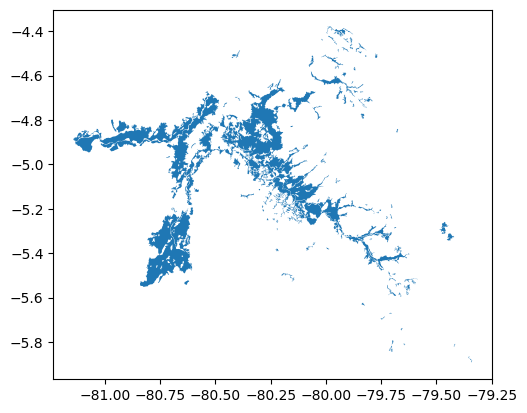

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'


map_uso_agricola_PIURA.plot()
plt.show()

In [ ]:
map_uso_agricola_AMAZONAS

,DESC_USO,CODIGO,HECTAREA,geometry
6,Frente Productivo de Predominio Arrocero,1,14554,"MULTIPOLYGON (((107611.414 9375289, 107808.82 ..."
7,Frente Productivo de Predominio Cafetalero,2,108857,"MULTIPOLYGON (((240630.703 9281424, 240651.547..."
8,Frente Productivo de predominio de Agricultura...,5,411011,"MULTIPOLYGON (((186013.922 9552977, 185962.906..."
9,Frente Productivo de Predominio de Agricultura...,4,167016,"MULTIPOLYGON (((179988.453 9233956, 180063.75 ..."
10,Frente Productivo de Predominio de Cultivos An...,3,201993,"MULTIPOLYGON (((170684.141 9286136, 170530.609..."


In [ ]:
map_uso_agricola_NORTE = pd.concat([map_uso_agricola_PIURA, map_uso_agricola_LAMBAYEQUE, map_uso_agricola_TUMBES])

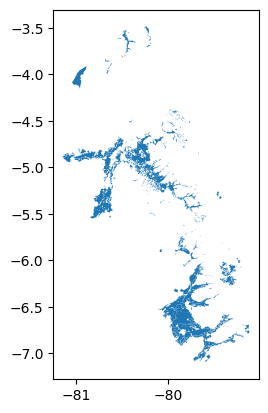

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'


map_uso_agricola_NORTE.plot()
plt.show()

In [ ]:
map_inundacion

,SIMBOLO_,REGIóN2,FISIOG1,COBUSO,SIMBOLO,NOMBRE,Shape_Leng,Shape_Area,OBJECTID,contacto,whatsapp,descarga,geometry
0,None,Costa,None,None,None,None,117.184047,0.501985,1.0,juan.suyo@geogpsperu.com,931381206,www.geogpsperu.com,"MULTIPOLYGON (((-80.63729 -5.38365, -80.63729 ..."
1,None,SELVA - Selva Alta,Planicie - Fondo de valle y llanura aluvial,Bosque humedo tropical,None,None,5.633069,0.024237,3.0,juan.suyo@geogpsperu.com,931381206,www.geogpsperu.com,"MULTIPOLYGON (((-78.54809 -5.59339, -78.54675 ..."
2,None,SIERRA - Zona Altoandina,Planicie - Altiplanicie,Pajonal,None,None,28.730173,0.472681,12.0,juan.suyo@geogpsperu.com,931381206,www.geogpsperu.com,"MULTIPOLYGON (((-70.87181 -14.57697, -70.87175..."
3,None,SIERRA - Zona Altoandina,Planicie - Fondo de valle glaciar,Pastos hidromórficos andinos (bofedales),None,None,5.985941,0.016805,13.0,juan.suyo@geogpsperu.com,931381206,www.geogpsperu.com,"MULTIPOLYGON (((-72.73946 -14.69681, -72.73856..."
4,None,SIERRA - Zona Bajoandina,Planicie - Fondo de valle y llanura aluvial,Actividad agropecuaria,None,None,3.639684,0.015539,14.0,juan.suyo@geogpsperu.com,931381206,www.geogpsperu.com,"MULTIPOLYGON (((-76.12203 -9.83561, -76.12046 ..."
5,None,SIERRA - Zona Mesoandina,Planicie - Fondo de valle y llanura aluvial,Actividad agropecuaria,None,None,2.291575,0.012694,15.0,juan.suyo@geogpsperu.com,931381206,www.geogpsperu.com,"MULTIPOLYGON (((-72.20667 -13.436, -72.20696 -..."
6,Bo,SIERRA - Zona Altoandina,Planicie - Altiplanicie,Bofedal,Bo,Bofedal,3.924554,0.057426,16.0,juan.suyo@geogpsperu.com,931381206,www.geogpsperu.com,"MULTIPOLYGON (((-76.21951 -10.81938, -76.21893..."
7,Bo,SIERRA - Zona Altoandina,Planicie - Fondo de valle glaciar,Pastos hidromórficos andinos (bofedales),Bo,Bofedal,0.318430,0.000658,17.0,juan.suyo@geogpsperu.com,931381206,www.geogpsperu.com,"MULTIPOLYGON (((-76.79347 -10.30987, -76.79468..."
8,V-a,Costa,Planicie - Valle y llanura irrigada,Agricultura bajo riego,None,None,36.930743,0.488571,27.0,juan.suyo@geogpsperu.com,931381206,www.geogpsperu.com,"MULTIPOLYGON (((-79.67684 -6.07833, -79.67797 ..."
9,V-a,Costa,Planicie - Valle y llanura irrigada,Manglar,Mg,Manglar,0.009742,0.000005,28.0,juan.suyo@geogpsperu.com,931381206,www.geogpsperu.com,"POLYGON ((-80.30661 -3.40608, -80.30675 -3.406..."


In [ ]:
map_inundacion['COBUSO'].unique()

array([None, 'Bosque humedo tropical', 'Pajonal',
       'Pastos hidromórficos andinos (bofedales)',
       'Actividad agropecuaria', 'Bofedal', 'Agricultura bajo riego',
       'Manglar'], dtype=object)

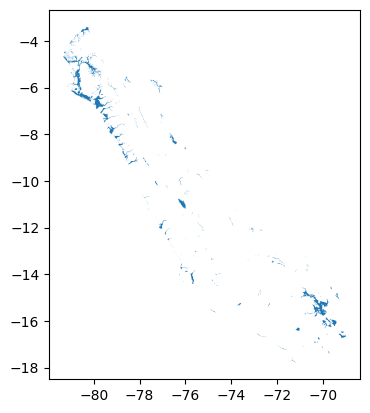

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'

map_inundacion.plot()
plt.show()


In [ ]:
# Crear el diccionario de mapeo de NOMBDEP a ZONA
zonas = {
    'AMAZONAS': 'NORTE',
    'ANCASH': 'CENTRO',
    'APURIMAC': 'SUR',
    'AREQUIPA': 'SUR',
    'AYACUCHO': 'SUR',
    'CAJAMARCA': 'NORTE',
    'CALLAO': 'CENTRO',
    'CUSCO': 'SUR',
    'HUANCAVELICA': 'CENTRO',
    'HUANUCO': 'CENTRO',
    'ICA': 'CENTRO',
    'JUNIN': 'CENTRO',
    'LA LIBERTAD': 'NORTE',
    'LAMBAYEQUE': 'NORTE',
    'LIMA': 'CENTRO',
    'LORETO': 'ORIENTE',
    'MADRE DE DIOS': 'ORIENTE',
    'MOQUEGUA': 'SUR',
    'PASCO': 'CENTRO',
    'PIURA': 'NORTE',
    'PUNO': 'SUR',
    'SAN MARTIN': 'ORIENTE',
    'TACNA': 'SUR',
    'TUMBES': 'NORTE',
    'UCAYALI': 'ORIENTE'
}

# Crear la nueva columna ZONA usando el mapeo
map_dep['ZONA'] = map_dep['NOMBDEP'].map(zonas)

# Verificar los cambios
print(map_dep.head())



   OBJECTID_1  OBJECTID CCDD   NOMBDEP      CAPITAL  Shape_STAr  Shape_STLe  \
0           1       1.0   01  AMAZONAS  CHACHAPOYAS    3.203006   12.912088   
1           2       2.0   02    ANCASH       HUARAZ    2.954592   11.780424   
2           3       3.0   03  APURIMAC      ABANCAY    1.765933    7.730154   
3           4       4.0   04  AREQUIPA     AREQUIPA    5.330203   17.405040   
4           5       5.0   05  AYACUCHO     AYACUCHO    3.643705   17.127166   

   ORIG_FID  Shape_Leng  Shape_Area                    CORREO  \
0         0   12.912088    3.203006  juan.suyo@geogpsperu.com   
1         1   11.780424    2.954592  juan.suyo@geogpsperu.com   
2         2    7.730154    1.765933  juan.suyo@geogpsperu.com   
3         3   17.405040    5.330203  juan.suyo@geogpsperu.com   
4         4   17.127166    3.643705  juan.suyo@geogpsperu.com   

             CONTACTO   WHATSAPP  \
0  www.geogpsperu.com  931381206   
1  www.geogpsperu.com  931381206   
2  www.geogpsperu.com  931

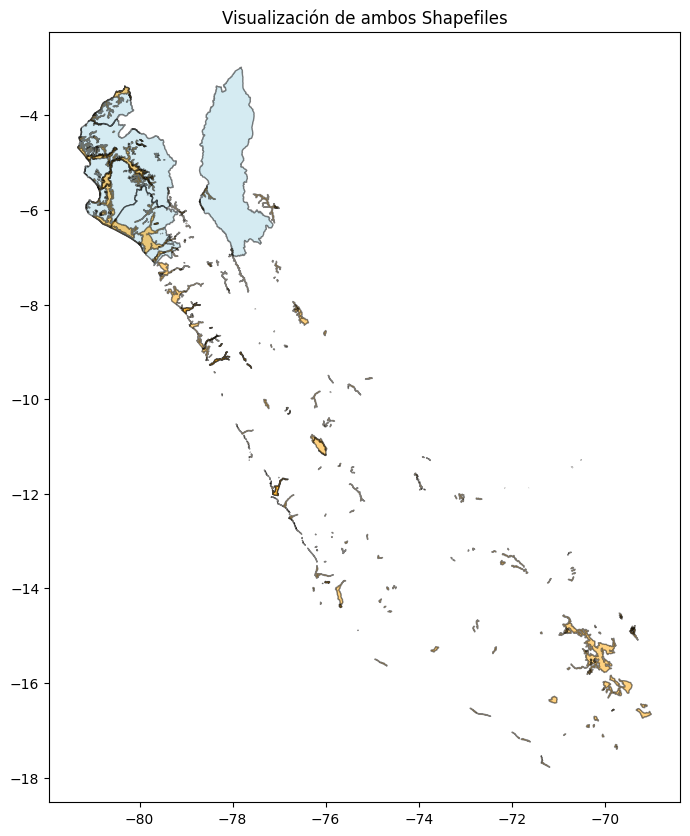

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=(10, 10))

# Plotear el primer shapefile
map_dep_norte.plot(ax=ax, color='lightblue', edgecolor='black', alpha=0.5)

# Plotear el segundo shapefile encima del primero
map_inundacion.plot(ax=ax, color='orange', edgecolor='black', alpha=0.5)

# Agregar título y otras personalizaciones
ax.set_title('Visualización de ambos Shapefiles')

# Mostrar el gráfico
plt.show()

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'


map_uso_agricola.plot()
plt.show()

NameError: name 'map_uso_agricola' is not defined

In [ ]:
map_dep_norte

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=(10, 10))

# Plotear el primer mapa
map_dep_norte.plot(ax=ax, color=map_dep['color'], edgecolor='black', alpha=0.5)

# Plotear el primer mapa con los colores asignados
# mapa1.plot(ax=ax, color=mapa1['color'], edgecolor='black', alpha=1)


# Guardar los límites del primer mapa
xlim = ax.get_xlim()
ylim = ax.get_ylim()

# Plotear el segundo mapa (superpuesto) en el mismo eje
map_inundacion.plot(ax=ax, edgecolor='black', alpha=0.5)

# Ajustar los límites del segundo mapa para que coincidan con los del primero
ax.set_xlim(xlim)
ax.set_ylim(ylim)

# Opcional: Agregar título y otras personalizaciones
ax.set_title('Áreas inundables de la Zona Norte')

# Mostrar el gráfico
plt.show()

In [ ]:

import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=(10, 10))

# Plotear el primer mapa (map_dep_norte) con colores personalizados
map_dep_norte.plot(ax=ax, color=map_dep['color'], edgecolor='black', alpha=0.5)

# Guardar los límites del primer mapa
xlim = ax.get_xlim()
ylim = ax.get_ylim()

# Plotear el segundo mapa (map_inundacion) en el mismo eje
map_inundacion.plot(ax=ax, edgecolor='black', alpha=0.5)

# Plotear el tercer mapa (map_uso_agricola) en el mismo eje
map_uso_agricola_NORTE.plot(ax=ax, edgecolor='red', alpha=0.5)  # Ajusta el color y alpha según necesites

# Ajustar los límites del segundo y tercer mapa para que coincidan con los del primero
ax.set_xlim(xlim)
ax.set_ylim(ylim)

# Opcional: Agregar título y otras personalizaciones
ax.set_title('Áreas Inundables y Uso Agrícola en la Zona Norte')

# Mostrar el gráfico
plt.show()


In [ ]:
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'

# Crear la figura con 3 subplots (uno por departamento)
fig, axs = plt.subplots(1, 3, figsize=(20, 8))  # 1 fila, 3 columnas

# Lista de datos por departamento
departamentos = [
    ('PIURA', map_dep_piura, map_inundacion, map_uso_agricola_PIURA),
    ('TUMBES', map_dep_tumbes, map_inundacion, map_uso_agricola_TUMBES),
    ('LAMBAYEQUE', map_dep_lambayeque, map_inundacion, map_uso_agricola_LAMBAYEQUE)
]

# Graficar cada departamento en su subplot
for ax, (nombre, map_dep, map_inundacion, map_uso_agricola) in zip(axs, departamentos):
    map_dep.plot(ax=ax, color='lightblue', edgecolor='black', alpha=0.5)
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    map_inundacion.plot(ax=ax, edgecolor='black', alpha=0.5)
    map_uso_agricola.plot(ax=ax, edgecolor='red', alpha=0.5)

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_title(f'{nombre}', fontsize=14)
    ax.axis('off')  # Opcional, para quitar ejes

# Ajustar espacios
plt.tight_layout()
fig.suptitle('Áreas Inundables y Uso Agrícola en la Zona Norte', fontsize=16, y=1.02)
plt.show()


In [ ]:
## Datos

In [ ]:
# importando data:
import pandas as pd

# Importando el archivo Excel
db1 = pd.read_excel('indicadores.xlsx', sheet_name='Hoja1')

# Mostrar las primeras filas
print(db1.head())


In [ ]:
db2 = pd.merge(db1, map_dep,
               how='right',
               left_on='NOMBDEP',
               right_on='NOMBDEP')

In [ ]:
db3 = db2.drop(['CORREO', 'WHATSAPP', 'CONTACTO'], axis=1, errors='ignore')

In [ ]:
db3.head()

In [ ]:
import mapclassify
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Circle
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'
import geopandas as gpd
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="matplotlib")

colors = ['white', "#CCD3DF", "#72D2D5", "#111149"]
cmap = LinearSegmentedColormap.from_list("my_cmap", colors)

fig, ax = plt.subplots(figsize=(10, 10))
ax.set_aspect('equal')
ax.set_axis_off()

db4 = gpd.GeoDataFrame(db3, geometry='geometry')

# Rellenamos los valores faltantes con 0
db4['INDICADOR 1'] = db4['INDICADOR 1'].fillna(0)

mapa = db4.plot(column='INDICADOR 1', cmap=cmap, scheme='quantiles', k=5,
                legend=True, ax=ax, edgecolor='black', alpha=1, zorder=0.5)

# Leyenda
mapa.get_legend().set_bbox_to_anchor((0.25, 0.2))
mapa.get_legend().set_title('Indicador de la Actividad Productiva Departamental')
mapa.get_legend().set_frame_on(False)

# Ajustes del círculo
radio_del_circulo = 0.1
desplazamiento_circulo_x = -0.02
desplazamiento_circulo_y = -0.02

plt.xticks([])
plt.yticks([])
plt.show()


output_path1 = "/content/drive/My Drive/BCRP/output/mapa_peru.png"
fig.savefig(output_path1, dpi=800, bbox_inches='tight')
print(f"Imagen guardada en: {output_path1}")

### **Inundaciones**

| **Tipo**   | **Origen Principal**                | **Zona Afectada**               | **Riesgo Adicional**         |
|------------|-------------------------------------|---------------------------------|------------------------------|
| Fluvial    | Desborde de ríos                    | Riberas de ríos                 | Inundación prolongada        |
| Aluvial    | Agua + sedimentos desde cerros      | Laderas y quebradas             | Huaicos destructivos         |
| Pluvial    | Lluvias urbanas sin drenaje         | Ciudades o zonas urbanas        | Daños localizados            |

**Tabla 1**: Comparación entre tipos de inundación

#### Inundación Fluvial
Este tipo de inundación ocurre por el **desborde de ríos o quebradas**, generalmente como consecuencia de lluvias intensas o del deshielo. Afecta principalmente a las áreas cercanas al cauce del río y es el tipo de inundación más común en muchas regiones.

#### Inundación Aluvial
Se produce por la bajada violenta de **agua, sedimentos y rocas** desde zonas altas como cerros o quebradas, afectando principalmente laderas, quebradas o conos aluviales. Un ejemplo típico son los huaicos en Perú, donde las lluvias intensas arrastran lodo y piedras. Este tipo de inundación es más destructivo y repentino que las inundaciones fluviales.

#### Inundación Pluvial
Este tipo de inundación se origina por lluvias intensas en zonas urbanas cuando **el sistema de drenaje es insuficiente** para evacuar el agua acumulada. Afecta principalmente calles y áreas pavimentadas de las ciudades. Un ejemplo de este fenómeno son las inundaciones registradas en algunas zonas de Lima durante episodios de lluvias atípicas. A diferencia de las inundaciones fluviales, su causa principal no es el desborde de ríos, sino la limitada capacidad del drenaje urbano.


# Sullana